# **DATA103 Final Project:  Credit Scoring**

Authors:

**Overview of the Project:**

**Problem Statement:**

**Objectives:**

## **Dataset Used**


We use this Kaggle dataset. However, we only used train.csv for model training since it already had sufficient amount of data. Later on, it can be seen that we split train.csv into both our train and test data.

## List of Requirements

In [ ]:
pip install lime

# Preliminaries

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import re
from itertools import combinations
from wordcloud import WordCloud

plt.rcParams["figure.figsize"] = (10, 6)
sns.set_style("whitegrid")
pd.set_option("display.float_format", lambda x: "%.3f" % x)
pd.set_option("display.max_rows", 500)
pd.set_option("display.max_columns", 30)


import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)


#SKLearn packages
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve, auc, confusion_matrix, recall_score, make_scorer
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold



#TensoFlow
import tensorflow
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.optimizers import Adam

#XGBoost
import xgboost as xgb
from xgboost import XGBClassifier



#SMOTE
from imblearn.over_sampling import SMOTE

#LIME packages
import lime
import lime.lime_tabular


#SHAP packages
import shap

#PDP packages




# This is so we can use the .csv file uploaded on GitHub
import ssl
ssl._create_default_https_context = ssl._create_unverified_context # Ignore SSL certificate errors

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/jinzalabim/DATA103-Final-Project/refs/heads/main/Original_Cred_Score%20Data/train.csv')
print(df.head)

<bound method NDFrame.head of             ID Customer_ID     Month           Name   Age          SSN  \
0       0x1602   CUS_0xd40   January  Aaron Maashoh    23  821-00-0265   
1       0x1603   CUS_0xd40  February  Aaron Maashoh    23  821-00-0265   
2       0x1604   CUS_0xd40     March  Aaron Maashoh  -500  821-00-0265   
3       0x1605   CUS_0xd40     April  Aaron Maashoh    23  821-00-0265   
4       0x1606   CUS_0xd40       May  Aaron Maashoh    23  821-00-0265   
...        ...         ...       ...            ...   ...          ...   
99995  0x25fe9  CUS_0x942c     April          Nicks    25  078-73-5990   
99996  0x25fea  CUS_0x942c       May          Nicks    25  078-73-5990   
99997  0x25feb  CUS_0x942c      June          Nicks    25  078-73-5990   
99998  0x25fec  CUS_0x942c      July          Nicks    25  078-73-5990   
99999  0x25fed  CUS_0x942c    August          Nicks    25  078-73-5990   

      Occupation Annual_Income  Monthly_Inhand_Salary  Num_Bank_Accounts  \
0    

<ipython-input-8-46fcaece302f>:1: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('https://raw.githubusercontent.com/jinzalabim/DATA103-Final-Project/refs/heads/main/Original_Cred_Score%20Data/train.csv')


In [ ]:
df.describe()

,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Num_Credit_Inquiries,Credit_Utilization_Ratio,Total_EMI_per_month
count,84998.000,100000.000,100000.000,100000.000,100000.000,98035.000,100000.000,100000.000
mean,4194.171,17.091,22.474,72.466,21.069,27.754,32.285,1403.118
std,3183.686,117.405,129.057,466.423,14.860,193.177,5.117,8306.041
min,303.645,-1.000,0.000,1.000,-5.000,0.000,20.000,0.000
25%,1625.568,3.000,4.000,8.000,10.000,3.000,28.053,30.307
50%,3093.745,6.000,5.000,13.000,18.000,6.000,32.306,69.249
75%,5957.448,7.000,7.000,20.000,28.000,9.000,36.497,161.224
max,15204.633,1798.000,1499.000,5797.000,67.000,2597.000,50.000,82331.000


In [ ]:
df.describe(include="object").T

,count,unique,top,freq
ID,100000,100000,0x1602,1
Customer_ID,100000,12500,CUS_0xd40,8
Month,100000,8,January,12500
Name,90015,10139,Langep,44
Age,100000,1788,38,2833
SSN,100000,12501,#F%$D@*&8,5572
Occupation,100000,16,_______,7062
Annual_Income,100000,18940,36585.12,16
Num_of_Loan,100000,434,3,14386
Type_of_Loan,88592,6260,Not Specified,1408


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

In [ ]:
df.duplicated().sum()

0

In [ ]:
# Check missing values
missing_values = df.isnull().sum()
print("Missing values per column:\n", missing_values)


Missing values per column:
 ID                              0
Customer_ID                     0
Month                           0
Name                         9985
Age                             0
SSN                             0
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary       15002
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                11408
Delay_from_due_date             0
Num_of_Delayed_Payment       7002
Changed_Credit_Limit            0
Num_Credit_Inquiries         1965
Credit_Mix                      0
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           9030
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4479
Payment_Behaviour               0
Monthly_Balance              1200
Credit_Score                    0
dtype: int64


There's actually a lot of missing or NaN values. There are two ways to go about it: we can start cleaning the data now, or we can continue exploring the NaN values.

We actually go with the latter since there's a lot of NaN values, we want to check maximum number of missing values (NaN) in any row.

In [ ]:
# Maximum missing values per row
df.isna().sum(axis=1).max()

5

What we do next is for the resulting DataFrame to show all rows from df that have exactly 5 missing (NaN) values. From here, it can be seen better which columns we can drop and which columns can be imputed.

In [ ]:
# Rows with 5 missing values
df[df.isna().sum(axis=1) == 5]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
896,0x1b42,CUS_0x365a,January,NaN,54,026-57-5729,Scientist,41345.58,NaN,0,5,10,0,NaN,7,3,2.42,4.000,_,646.47,23.042,NaN,No,0.000,NaN,Low_spent_Small_value_payments,187.93428046477558,Standard
4490,0x3050,CUS_0x3019,March,NaN,51,346-10-4963,Writer,99007.68,8223.640,7,7,8,0,NaN,14,NaN,3.08,2.000,_,31.89,26.221,NaN,No,0.000,NaN,High_spent_Small_value_payments,750.5733017643256,Good
7012,0x3f16,CUS_0x6171,May,NaN,52,584-89-4764,_______,149168.88,NaN,3,5,1,0,NaN,8,7,9.65,0.000,Good,903.48,43.610,NaN,No,0.000,NaN,High_spent_Small_value_payments,1239.9888997857151,Good
56818,0x162ec,CUS_0x9ee4,March,NaN,7919,425-72-7007,Manager,102745.4,NaN,4,5,11,0,NaN,14,15,3.8,4.000,_,465.88,31.721,NaN,No,0.000,NaN,High_spent_Large_value_payments,1036.0588129965113,Good
69031,0x1aa79,CUS_0x4eae,August,NaN,37,#F%$D@*&8,_______,44968.15,NaN,1,5,2,0,NaN,9,NaN,1.22,6.000,Good,871.85,34.452,NaN,No,0.000,86.31346044034277,High_spent_Large_value_payments,506.52112289299055,Good
76326,0x1d538,CUS_0xa2ca,July,NaN,37,225-27-1573,Developer,37475.07,NaN,3,4,7,-100,NaN,14,NaN,9.77,7.000,Good,437.45_,26.222,NaN,No,0.000,42.17219171407305,High_spent_Large_value_payments,505.220058285927,Good
92669,0x234fb,CUS_0x4203,June,NaN,42,857-44-8236,Musician,39649.74,NaN,5,3,5,0,NaN,15,NaN,1.47,7.000,Good,1338.65,40.445,NaN,No,0.000,401.81986192160866,Low_spent_Small_value_payments,195.99463807839143,Standard


# **Data Preprocessing**

## **Drop Irrelevant Columns**

The `Name` column is not relevant for credit scoring because it doesn’t contribute to a person's financial credibility. Dropping it helps streamline the dataset and focus on useful features.

In [ ]:
# Drop the 'Name' column as it is irrelevant for credit scoring
df.drop(columns=['Name','Customer_ID', 'ID'], inplace=True)

## **Handle Missing Data**

### **Missing Numerical Data**
Missing numerical data in columns like `Monthly_Inhand_Salary` or `Num_of_Delayed_Payment` may be due to reporting gaps. Using the median to fill these gaps is a robust choice because it is less affected by extreme values than the mean.

In [ ]:
# Define numerical columns with missing values
numerical_cols = ['Monthly_Inhand_Salary', 'Num_of_Delayed_Payment',
                  'Num_Credit_Inquiries', 'Amount_invested_monthly',
                  'Monthly_Balance', 'Outstanding_Debt']

# Convert columns to numeric and fill missing values with the median
for col in numerical_cols:
    df[col] = pd.to_numeric(df[col], errors='coerce')  # Ensure numeric data
    df[col] = df[col].fillna(df[col].median())         # Fill missing with median

The Credit_History_Age column contains information in a mixed textual format like "2 years 3 months." We convert this into a numeric representation (total months) for consistency and fill missing values with the median.



In [ ]:
# Define a helper function to parse 'Credit_History_Age' into total months
def parse_credit_history(age_str):

    # Handle 'NA' and missing values
    if pd.isnull(age_str) or age_str == 'NA' or age_str == '':
        return np.nan

    # Clean the input to standardize it (remove 'and' and handle different cases)
    age_str = age_str.replace('and', '').strip()

    years, months = 0, 0
    if 'Years' in age_str:
        years = int(age_str.split('Years')[0].strip())
    if 'Months' in age_str:
        months = int(age_str.split('Months')[0].split()[-1].strip())

    return years * 12 + months

# Apply the transformation and fill missing values with the median
df['Credit_History_Age'] = df['Credit_History_Age'].apply(parse_credit_history)
df['Credit_History_Age'] = df['Credit_History_Age'].fillna(df['Credit_History_Age'].median())

In [ ]:
# Print the transformed column
print(df['Credit_History_Age'])

0       265.000
1       219.000
2       267.000
3       268.000
4       269.000
          ...  
99995   378.000
99996   379.000
99997   380.000
99998   381.000
99999   382.000
Name: Credit_History_Age, Length: 100000, dtype: float64


### **Missing Categorical Data**

For the `Type_of_Loan`, missing values likely represent cases where no information was provided. Assigning them the category "Unknown" ensures that we do not lose data and keep the categorical structure intact.



In [ ]:
# Fill missing values in 'Type_of_Loan' with "Unknown"
df['Type_of_Loan'] = df['Type_of_Loan'].fillna('Unknown')

## **Feature Extraction & Transformation**

### **Feature Extraction**

#### **Debt-to-Income Ratio**
For feature extraction, we'd want to create a **Debt-to-Income (DTI) ratio ** to compare an individual's total monthly debt payments to their gross monthly income. It's a critical indicator of an individual's ability to manage debt. A high DTI ratio suggests that the person might struggle to repay debts, while a low DTI ratio indicates that they are more likely to manage debt effectively.

In our dataset, the relevant columns for calculating the DTI ratio are:

* Outstanding_Debt: This likely represents the total debt the individual owes.
* Monthly_Inhand_Salary: This is the person's monthly income.

In [ ]:
# Convert 'Outstanding_Debt' and 'Monthly_Inhand_Salary' to numeric
df['Outstanding_Debt'] = pd.to_numeric(df['Outstanding_Debt'], errors='coerce')
df['Monthly_Inhand_Salary'] = pd.to_numeric(df['Monthly_Inhand_Salary'], errors='coerce')

In [ ]:
# Calculate Debt-to-Income ratio (DTI)
df['Debt_to_Income_Ratio'] = df['Outstanding_Debt'] / df['Monthly_Inhand_Salary']

In [ ]:
# Display the result
print(df[['Outstanding_Debt', 'Monthly_Inhand_Salary', 'Debt_to_Income_Ratio']])

       Outstanding_Debt  Monthly_Inhand_Salary  Debt_to_Income_Ratio
0               809.980               1824.843                 0.444
1               809.980               3093.745                 0.262
2               809.980               3093.745                 0.262
3               809.980               3093.745                 0.262
4               809.980               1824.843                 0.444
...                 ...                    ...                   ...
99995           502.380               3359.416                 0.150
99996           502.380               3359.416                 0.150
99997           502.380               3359.416                 0.150
99998           502.380               3359.416                 0.150
99999           502.380               3359.416                 0.150

[100000 rows x 3 columns]


#### **Convert Credit_History_Age and SSN**

The reason for converting a continuous variable like Credit_History_Age into bins is primarily to make the data more interpretable and useful for analysis.

For Credit_History_Age, it's easier for it to be binned.

For SSN, since it's an ID, we can instead make it so it just shows who has SSN or who don't.


The code first converts the Credit_History_Age from years to months by multiplying the value by 12, creating a new column called Credit_History_Age_in_months. It then bins the Credit_History_Age_in_months into five categories using the pd.cut() function. These categories are defined as: 'No History' for ages less than or equal to 0 months, '<1 Year' for less than 12 months, '1-5 Years' for 12 to 60 months, '5-10 Years' for 60 to 120 months, and '10+ Years' for greater than 120 months. Finally, it prints the first few rows of the DataFrame showing the original Credit_History_Age, the new Credit_History_Age_in_months, and the newly assigned Credit_History_Category.

In [ ]:
# Convert Credit_History_Age (in years) to months
df['Credit_History_Age_in_months'] = df['Credit_History_Age'] * 12

# Bin the Credit_History_Age into categories based on months
df['Credit_History_Category'] = pd.cut(df['Credit_History_Age_in_months'],
                                       bins=[-float('inf'), 0, 12, 60, 120, float('inf')],
                                       labels=['No History', '<1 Year', '1-5 Years', '5-10 Years', '10+ Years'])

# Check the result
print(df[['Credit_History_Age', 'Credit_History_Age_in_months', 'Credit_History_Category']].head())


   Credit_History_Age  Credit_History_Age_in_months Credit_History_Category
0             265.000                      3180.000               10+ Years
1             219.000                      2628.000               10+ Years
2             267.000                      3204.000               10+ Years
3             268.000                      3216.000               10+ Years
4             269.000                      3228.000               10+ Years


In [ ]:
# Transform the SSN column into a binary indicator
df['Has_SSN'] = df['SSN'].notnull().astype(int)

# Drop the original 'SSN' column if it's no longer needed
df.drop(columns=['SSN'], inplace=True)

#### **Loan_Count**

If a customer's Type_of_Loan  has multiple loans in a single entry (e.g., "Home Loan, Personal Loan"), we split and count. We do this because so that we have a numerical representation of how many loan types an individual has.

In [ ]:
df['Loan_Count'] = df['Type_of_Loan'].apply(lambda x: len(x.split(',')))


#### **Seperating Type_of_Loan into Individual Binary Categories**

Since `Type_of_Loan` column is in a comma-separated list of loan types, we want to turn them into into individual binary categories (yes/no) for each loan type. We do this because it allows us to represent each loan type as a separate feature (column), making it suitable for machine learning models that require numerical inputs. In addition, the original format's list can lead to confusion in model interpretation. By converting them to binary columns, we avoid treating the loan types as ordinal or ranked data.


### Example:

If the original `Type_of_Loan` column looked like this:

| Type_of_Loan                                      |
|---------------------------------------------------|
| Auto Loan, Personal Loan, Credit-Builder Loan     |
| Auto Loan, Personal Loan                          |
| Personal Loan                                     |
| Credit-Builder Loan                               |

After applying the transformation, the resulting DataFrame would look like this:

| Auto Loan | Personal Loan | Credit-Builder Loan |
|-----------|---------------|---------------------|
| 1         | 1             | 1                   |
| 1         | 1             | 0                   |
| 0         | 1             | 1                   |
| 0         | 1             | 1                   |


In [ ]:
# Step 1: Get all unique loan types from the Type_of_Loan column
# First, we need to combine all loan types and get the unique ones
unique_loan_types = set()

# Loop through all rows in 'Type_of_Loan' column and split by comma
for loans in df['Type_of_Loan'].dropna():
    unique_loan_types.update(loans.split(','))

# List of unique loan types
unique_loan_types = list(unique_loan_types)

In [ ]:
# Step 2: Create a binary column for each unique loan type
for loan in unique_loan_types:
    loan = loan.strip()  # Remove any extra spaces around loan types
    # Create a new column where 1 indicates the presence of this loan type and 0 otherwise
    df[loan] = df['Type_of_Loan'].apply(lambda x: 1 if loan in x.split(',') else 0)

In [ ]:
# Step 3: Drop the original 'Type_of_Loan' column as it's no longer needed
df.drop('Type_of_Loan', axis=1, inplace=True)

However, we're not finished there since it seperated 'Personal Loan' and 'and Personal Loan', 'Debt Consolidation Loan', and 'and Debt Consolidation Loan', etc., we merge them together.

In [ ]:
# List of loan types to merge
loan_types = [
    'Credit-Builder Loan', 'Payday Loan', 'Personal Loan',
    'Home Equity Loan', 'Mortgage Loan', 'Auto Loan',
    'Student Loan', 'Debt Consolidation Loan'
]

# Merge each base column with its respective 'and' column
for loan in loan_types:
    if f'and {loan}' in df.columns:
        # Add the 'and' column to the base column
        df[loan] += df[f'and {loan}']
        # Drop the 'and' column after merging
        df.drop(columns=[f'and {loan}'], inplace=True)  # Drop the merged column


The part above handles merging each loan type's base column with its respective `and` column. We then handle `'Not Specified'` and related columns.


In [ ]:
# Special handling for 'Not Specified' and related columns
not_specified_cols = ['Not Specified', 'and Not Specified', 'Unknown']

# Check which columns exist in the DataFrame
existing_not_specified_cols = [col for col in not_specified_cols if col in df.columns]

# If any of the 'Not Specified' related columns exist, merge them into one column
if existing_not_specified_cols:
    # Sum the relevant columns into 'Not Specified Loans'
    df['Not Specified Loans'] = df[existing_not_specified_cols].sum(axis=1)
    # Drop the merged 'Not Specified' columns
    df.drop(columns=existing_not_specified_cols, inplace=True)


In [ ]:
# Check if the 'Not Specified Loans' column is now present
print('Columns in DataFrame after merge:', df.columns)

# Final merged loan types list
merged_loan_types_dict = [
    'Credit-Builder Loan', 'Payday Loan', 'Personal Loan',
    'Home Equity Loan', 'Mortgage Loan', 'Auto Loan',
    'Student Loan', 'Debt Consolidation Loan', 'Not Specified Loans'
]

# Check the final DataFrame to verify
print(df.head())


Columns in DataFrame after merge: Index(['Month', 'Age', 'Occupation', 'Annual_Income', 'Monthly_Inhand_Salary',
       'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score', 'Debt_to_Income_Ratio', 'Credit_History_Age_in_months',
       'Credit_History_Category', 'Has_SSN', 'Loan_Count', 'Auto Loan',
       'Credit-Builder Loan', 'Student Loan', 'Home Equity Loan',
       'Payday Loan', 'Personal Loan', 'Debt Consolidation Loan',
       'Mortgage Loan', 'Not Specified Loans'],
      dtype='object')
      Month   Age Occupation Annual_Income  Monthly_Inhand_Salary  \
0   January    23  Scientist      19114.12             

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 37 columns):
 #   Column                        Non-Null Count   Dtype   
---  ------                        --------------   -----   
 0   Month                         100000 non-null  object  
 1   Age                           100000 non-null  object  
 2   Occupation                    100000 non-null  object  
 3   Annual_Income                 100000 non-null  object  
 4   Monthly_Inhand_Salary         100000 non-null  float64 
 5   Num_Bank_Accounts             100000 non-null  int64   
 6   Num_Credit_Card               100000 non-null  int64   
 7   Interest_Rate                 100000 non-null  int64   
 8   Num_of_Loan                   100000 non-null  object  
 9   Delay_from_due_date           100000 non-null  int64   
 10  Num_of_Delayed_Payment        100000 non-null  float64 
 11  Changed_Credit_Limit          100000 non-null  object  
 12  Num_Credit_Inquiries          1

### **Feature Transformation**

#### For Credit Score

In [ ]:
# Initialize LabelEncoder
le = LabelEncoder()

In [ ]:
# Mapping for Credit_Score (Poor -> 0, Standard & Good -> 1)
credit_score_mapping = {
    'Poor': 0,
    'Standard': 1,
    'Good': 1
}

# Apply mapping to 'Credit_Score'
df['Credit_Score'] = df['Credit_Score'].map(credit_score_mapping)

The reason we map Credit score as this is so that the imbalanced data will be more apparent. And since we want to be granular with those with poor credit scores.

In [ ]:
print(df['Credit_Score'])

0        1
1        1
2        1
3        1
4        1
        ..
99995    0
99996    0
99997    0
99998    1
99999    0
Name: Credit_Score, Length: 100000, dtype: int64


#### For Age, Annual Income, Changed_Credit_Limit, Num_of_Loan, Changed_Credit_Limit

We'll ensure features such as Age, Annual_Income, and others are in proper numerical form (e.g., converting strings with numbers to floats or integers).


In [ ]:
# Convert 'Age' column to numeric, invalid values are turned into NaN
df['Age'] = pd.to_numeric(df['Age'], errors='coerce')

# Convert 'Annual_Income' column to numeric, invalid values are turned into NaN
df['Annual_Income'] = pd.to_numeric(df['Annual_Income'], errors='coerce')

# Convert 'Changed_Credit_Limit' column to numeric, invalid values are turned into NaN
df['Changed_Credit_Limit'] = pd.to_numeric(df['Changed_Credit_Limit'], errors='coerce')

# Convert 'Num_of_Loan' column to numeric, invalid values are turned into NaN
df['Num_of_Loan'] = pd.to_numeric(df['Num_of_Loan'], errors='coerce')

Since invalid values are turned into NaN, we have to handle them again. We do this by imputing them with appropriate values based on the type of data in each column. For numerical columns like '`Age`', the missing values are filled with the mean of the column, which ensures that the imputation does not drastically alter the overall distribution of the data. For '`Annual_Income`' and '`Num_of_Loan`', the missing values are filled with the median, which is less sensitive to outliers and helps maintain the integrity of the data when there are extreme values present. For the '`Changed_Credit_Limit`' column, missing values are similarly imputed with the mean to preserve the column's overall trend. For categorical data like '`Credit_History_Category`', missing values are filled with the mode, or the most frequent category, ensuring that the most common category remains dominant in the dataset. This approach ensures that the dataset is complete, making it ready for analysis or model training without the need to discard rows due to missing values.

In [ ]:
# Fill NaN in 'Age' with the mean of the column
df['Age'].fillna(df['Age'].mean(), inplace=True)

# Fill NaN in 'Annual_Income' with the median
df['Annual_Income'].fillna(df['Annual_Income'].median(), inplace=True)

# Fill NaN in 'Changed_Credit_Limit' with the mean
df['Changed_Credit_Limit'].fillna(df['Changed_Credit_Limit'].mean(), inplace=True)

# Fill NaN in 'Num_of_Loan' with the median
df['Num_of_Loan'].fillna(df['Num_of_Loan'].median(), inplace=True)

We create a list called numerical_cols to identify and store all the numerical columns in the dataset, excluding the binary loan columns. By organizing these columns into a dedicated list, we can easily recall them later when performing scaling or normalization. This step allows us to focus only on the relevant numerical features when applying StandardScaler during preprocessing.

In [ ]:
# New List of Numerical Columns without the binary loan columns
numerical_cols = ['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
                  'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date',
                  'Num_of_Delayed_Payment', 'Changed_Credit_Limit', 'Num_Credit_Inquiries',
                  'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Credit_History_Age',
                  'Total_EMI_per_month', 'Amount_invested_monthly', 'Monthly_Balance',
                  'Debt_to_Income_Ratio', 'Loan_Count',
                  'Num_of_Delayed_Payment', 'Num_Credit_Inquiries', 'Amount_invested_monthly',
                  'Monthly_Balance', 'Credit_History_Category']

#### Label Encoding for Categorical Columns


In [ ]:
# List of categorical columns to encode, excluding 'SSN'
categorical_columns = ['Month', 'Occupation', 'Credit_Mix', 'Payment_of_Min_Amount', 'Payment_Behaviour', 'Credit_History_Category']

# Create a LabelEncoder instance
label_encoder = LabelEncoder()

In [ ]:
# Dictionary to hold the mapping for each categorical column
mapping_dict = {}

# Apply LabelEncoder to each categorical column (excluding 'SSN')
for col in categorical_columns:
    df[col] = label_encoder.fit_transform(df[col].astype(str))  # Convert to string for consistent encoding
    mapping_dict[col] = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))

# Show the mappings
mapping_dict

{'Month': {'April': 0,
  'August': 1,
  'February': 2,
  'January': 3,
  'July': 4,
  'June': 5,
  'March': 6,
  'May': 7},
 'Occupation': {'Accountant': 0,
  'Architect': 1,
  'Developer': 2,
  'Doctor': 3,
  'Engineer': 4,
  'Entrepreneur': 5,
  'Journalist': 6,
  'Lawyer': 7,
  'Manager': 8,
  'Mechanic': 9,
  'Media_Manager': 10,
  'Musician': 11,
  'Scientist': 12,
  'Teacher': 13,
  'Writer': 14,
  '_______': 15},
 'Credit_Mix': {'Bad': 0, 'Good': 1, 'Standard': 2, '_': 3},
 'Payment_of_Min_Amount': {'NM': 0, 'No': 1, 'Yes': 2},
 'Payment_Behaviour': {'!@9#%8': 0,
  'High_spent_Large_value_payments': 1,
  'High_spent_Medium_value_payments': 2,
  'High_spent_Small_value_payments': 3,
  'Low_spent_Large_value_payments': 4,
  'Low_spent_Medium_value_payments': 5,
  'Low_spent_Small_value_payments': 6},
 'Credit_History_Category': {'1-5 Years': 0,
  '10+ Years': 1,
  '5-10 Years': 2,
  '<1 Year': 3}}

In [ ]:
print(df.head())
df.info()

   Month      Age  Occupation  Annual_Income  Monthly_Inhand_Salary  \
0      3   23.000          12      19114.120               1824.843   
1      2   23.000          12      19114.120               3093.745   
2      6 -500.000          12      19114.120               3093.745   
3      0   23.000          12      19114.120               3093.745   
4      7   23.000          12      19114.120               1824.843   

   Num_Bank_Accounts  Num_Credit_Card  Interest_Rate  Num_of_Loan  \
0                  3                4              3        4.000   
1                  3                4              3        4.000   
2                  3                4              3        4.000   
3                  3                4              3        4.000   
4                  3                4              3        4.000   

   Delay_from_due_date  Num_of_Delayed_Payment  Changed_Credit_Limit  \
0                    3                   7.000                11.270   
1             

## **Splitting the Data**

In [ ]:
# Split data into features and target
X = df.drop(columns=['Credit_Score'])  # Drop unnecessary columns
y = df['Credit_Score']  # Target variable

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## **Feature Scaling**

In [ ]:
print(numerical_cols)

['Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit', 'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Credit_History_Age', 'Total_EMI_per_month', 'Amount_invested_monthly', 'Monthly_Balance', 'Debt_to_Income_Ratio', 'Loan_Count', 'Num_of_Delayed_Payment', 'Num_Credit_Inquiries', 'Amount_invested_monthly', 'Monthly_Balance', 'Credit_History_Category']


For feature scaling, we really only have to scale the numerical columns.

In [ ]:
# Initialize scalers
scaler_num = StandardScaler()

In [ ]:
# Scale the numerical columns using StandardScaler
X_train[numerical_cols] = scaler_num.fit_transform(X_train[numerical_cols])
X_test[numerical_cols] = scaler_num.transform(X_test[numerical_cols])  # Don't fit on test data

# **Outlier Detection**

In [ ]:
# List of relevant columns
relevant_cols = [
    'Monthly_Inhand_Salary',
    'Num_of_Delayed_Payment',
    'Amount_invested_monthly',
    'Monthly_Balance',
    'Num_Credit_Inquiries'
]

# Dynamically determine the number of rows and columns for the layout
rows = (len(relevant_cols) + 2) // 3  # Add 2 to round up the number of rows
cols = 3  # Fixed number of columns

# Define the layout for the dashboard
fig = make_subplots(
    rows=rows,
    cols=cols,
    subplot_titles=relevant_cols  # Update subplot_titles to match relevant_cols
)

# Loop through each relevant column and add a boxplot to the dashboard
for i, col in enumerate(relevant_cols, start=1):
    # Add a boxplot for each column
    fig.add_trace(
        go.Box(
            y=df[col],
            boxmean='sd',  # Show mean and standard deviation for better context
            name=col
        ),
        row=(i - 1) // cols + 1,  # Determine row index (based on dynamic number of rows)
        col=(i - 1) % cols + 1  # Determine column index (fixed number of columns)
    )

# Update layout to make the dashboard look better
fig.update_layout(
    title="Boxplots of Numerical Columns with Outliers",
    showlegend=False,
    height=600,  # Adjust height to fit the plots
    width=1000,  # Adjust width to fit the plots
    template='plotly_dark',  # Dark theme
)

# Show the dashboard
fig.show()

For both `Num_of_Delayed_Payment` and `Num_Credit_Inquiries`, the data shows a strong concentration of values within a narrow range, which results in a low interquartile range (IQR). This indicates that outliers in these variables exert a disproportionately large influence and contribute significantly to their skewed distributions. These variables are critical in credit scoring as they directly reflect an individual’s financial behavior and creditworthiness.

`Num_of_Delayed_Payment` is particularly relevant because it represents a borrower’s history of delayed payments, which is a strong indicator of financial stress or difficulty in meeting financial obligations. A high number of delayed payments signals increased risk for lenders, making this feature essential for predicting default. Outliers in this variable, such as borrowers with exceptionally high delays, may represent a minority but are precisely the high-risk cases that credit scoring models need to identify. Ignoring or capping these values risks underestimating their importance in assessing financial reliability.

Similarly, `Num_Credit_Inquiries` reflects the frequency with which a borrower applies for credit, and its relevance lies in its ability to signal financial instability. Excessively high credit inquiries, particularly within a short period, could indicate desperation for credit or riskier borrowing habits. These outliers can flag potential issues, such as credit-seeking behavior indicative of financial distress. However, some cases, like individuals shopping for the best mortgage rates, may require nuanced analysis to avoid misclassification. Proper handling of outliers in this feature ensures that their significance is accurately captured without distorting the overall analysis.


### **Why are we doing Outlier Detection after Feature Scaling?**


Typically, outlier detection is done before feature scaling, however, we'll be using Tensorflow Auto Encoder for the outlier detection. Autoencoders, which are often used for outlier detection, learn to compress data and then reconstruct it. If the data is not scaled, the model may prioritize certain features over others due to differences in their magnitudes, leading to less accurate anomaly detection.


## **Tensor Flow Auto Encoder**

### **Why use TensorFlow Auto Encoder?**

Using TensorFlow’s autoencoder for outlier detection is ideal for handling our features. Autoencoders are powerful tools for detecting outliers because they learn the underlying patterns in the data by compressing it into a **latent representation and then reconstructing it.** Outliers are identified as data points with high reconstruction errors, as they deviate significantly from the learned patterns. TensorFlow offers a framework for building and training autoencoders, **enabling customization of network architecture and efficient handling of high-dimensional or nonlinear data.** Additionally, TensorFlow facilitates scalability for large datasets, GPU acceleration for faster training, and integration into production pipelines for real-time analysis. By using TensorFlow, we can dynamically detect and manage outliers in features like `Num_of_Delayed_Payment` and `Num_Credit_Inquiries`, ensuring they are properly incorporated into credit scoring models to capture their true significance.

In [ ]:
# Select the features for outlier detection
selected_features = [
    'Monthly_Inhand_Salary',
    'Num_of_Delayed_Payment',
    'Amount_invested_monthly',
    'Monthly_Balance',
    'Num_Credit_Inquiries'
]

# Ensure the DataFrame contains the selected features
df_selected = df[selected_features].copy()


# Scale the data to the [0, 1] range using MinMaxScaler
scaler = MinMaxScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_selected), columns=selected_features)

In [ ]:
# Build the Autoencoder
input_dim = len(selected_features) # Input layer dimensions are determined by the number of selected features

In [ ]:
# Encoder: Compress the input data
input_layer = Input(shape=(input_dim,), name="Input_Layer")
encoded = Dense(4, activation='relu', name="Encoded_Layer_1")(input_layer)
encoded = Dense(2, activation='relu', name="Encoded_Layer_2")(encoded)

# Decoder: Reconstruct the data back to the original dimensions
decoded = Dense(4, activation='relu', name="Decoded_Layer_1")(encoded)
decoded = Dense(input_dim, activation='sigmoid', name="Output_Layer")(decoded)

# Assemble the Autoencoder Model
autoencoder = Model(inputs=input_layer, outputs=decoded, name="Autoencoder_Model")
autoencoder.compile(optimizer=Adam(learning_rate=0.01), loss='mse')

In [ ]:
# Train the Autoencoder
history = autoencoder.fit(
    df_scaled, df_scaled,  # Input and target are identical
    epochs=50,
    batch_size=32,
    shuffle=True,
    validation_split=0.2,
    verbose=1
)

Epoch 1/50
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 22s 6ms/step - loss: 0.0163 - val_loss: 0.0052
Epoch 2/50
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 9s 2ms/step - loss: 0.0045 - val_loss: 0.0016
Epoch 3/50
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 4/50
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 5/50
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.0014 - val_loss: 0.0016
Epoch 6/50
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.0014 - val_loss: 0.0014
Epoch 7/50
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.0013 - val_loss: 0.0014
Epoch 8/50
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 11s 2ms/step - loss: 0.0013 - val_loss: 0.0014
Epoch 9/50
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 12s 3ms/step - loss: 0.0013 - val_loss: 0.0015
Epoch 10/50
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.0014 - val_loss: 0.0014
Epoch 11/50
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 0.0013 - val_loss: 0.0014
Epoch 12/50
2500/2500 ━━━━

In [ ]:
# Use the trained autoencoder to reconstruct the normalized data
reconstructed = autoencoder.predict(df_scaled)

3125/3125 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step


In [ ]:
# Calculate Mean Squared Error for each sample
reconstruction_errors = np.mean(np.square(df_scaled - reconstructed), axis=1)
print(f"Reconstruction errors calculated for {len(reconstruction_errors)} samples.")


# Dynamically set the threshold as mean + 2*std of reconstruction errors
threshold = np.mean(reconstruction_errors) + 2 * np.std(reconstruction_errors)
print(f"Threshold for outlier detection: {threshold:.4f}")

Reconstruction errors calculated for 100000 samples.
Threshold for outlier detection: 0.0201


Since the threshold for outlier detection based on reconstruction errors in our autoencoder model is **0.0266**, it's safe to say that there are only around than 2% outliers in our data and is a reasonable threshold for outlier detection.

In [ ]:
# Plot the reconstruction errors and threshold
fig = px.histogram(
    reconstruction_errors,
    nbins=50,
    title="Reconstruction Error Distribution for Selected Features",
    labels={'value': 'Reconstruction Error'},
    marginal="box"
)
fig.add_vline(x=threshold, line_dash="dash", line_color="red", annotation_text="Threshold")
fig.show()

In [ ]:
# Identify outliers based on reconstruction errors
outliers = reconstruction_errors > threshold
df_outliers = df_selected[outliers]
print(f"Number of Outliers Detected: {df_outliers.shape[0]}")
print(f"Outlier Indices: {df_outliers.index.tolist()}")

Number of Outliers Detected: 1030
Outlier Indices: [252, 284, 312, 348, 409, 503, 564, 1032, 1212, 1390, 1474, 1500, 1529, 1611, 1616, 1916, 2296, 2353, 2438, 2480, 2697, 2804, 2846, 2990, 3028, 3164, 3312, 3341, 3556, 3793, 3998, 4092, 4375, 4423, 4462, 4549, 4665, 4718, 4722, 4861, 4880, 5107, 5496, 5664, 5727, 5977, 6046, 6099, 6147, 6267, 6333, 6380, 6574, 6607, 6751, 6807, 6808, 6837, 6962, 6983, 7011, 7016, 7275, 7354, 7522, 7731, 7886, 7907, 7908, 8011, 8087, 8141, 8199, 8261, 8263, 8383, 8448, 8495, 8694, 8943, 9049, 9167, 9258, 9265, 9350, 9502, 9630, 9828, 9947, 9982, 10046, 10075, 10095, 10223, 10293, 10416, 10721, 10724, 10804, 10827, 10990, 11116, 11125, 11128, 11383, 11526, 11639, 11687, 11698, 11820, 11892, 12023, 12036, 12042, 12047, 12099, 12193, 12300, 12337, 12395, 12455, 12475, 12530, 12531, 12594, 12731, 12826, 12870, 12871, 13342, 13370, 13553, 13670, 13760, 13796, 13905, 14227, 14262, 14264, 14299, 14401, 14563, 14587, 15130, 15335, 15409, 15411, 15637, 15825, 16

Outliers identified by the autoencoder typically represent data points that deviate significantly from the rest of the dataset. Since there are 2029 outliers out of a data of 100,000, it's not a significant portion of our data especially since our domain is in credit scoring which means outliers can sometimes represent rare but important cases (e.g., credit risk or defaulting). Since we aim to predict who gets a poorer credit score, these outliers might contain useful information for identifying risky behavior, hence **we keep them**.

# **Model Training**


## **XGBoost Model**

The purpose here is to train a baseline XGBoost model with default parameters to establish a performance benchmark.

In [ ]:
# Train the initial XGBoost model without the use_label_encoder parameter
xgb_model = XGBClassifier(eval_metric='logloss', random_state=42)
xgb_model.fit(X_train, y_train)

# Predict on the test set
y_pred = xgb_model.predict(X_test)

### XGBoost Model Evaluation


For XGBoost's baseline Model Evaluation, we use:
* Accuracy for overall correctness.
* ROC-AUC for how well the model distinguishes between classes.
* Confusion Matrix for detailed error analysis.


In [ ]:
# Evaluate the model
print("Classification Report:\n", classification_report(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.71      0.74      5874
           1       0.88      0.91      0.90     14126

    accuracy                           0.85     20000
   macro avg       0.82      0.81      0.82     20000
weighted avg       0.85      0.85      0.85     20000



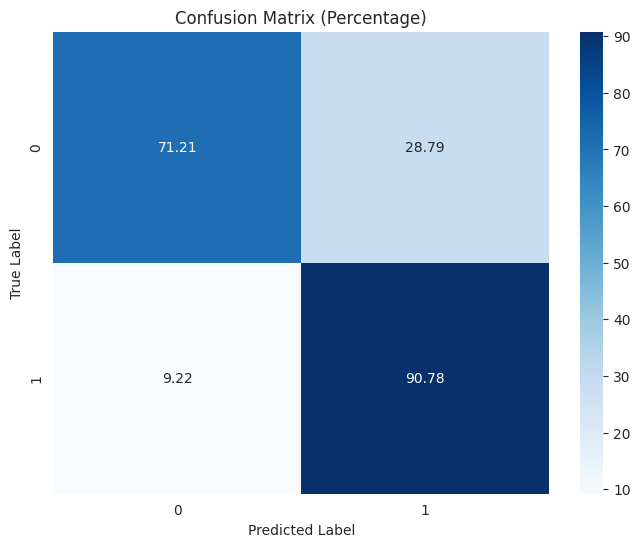

In [ ]:
# Compute the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Convert the confusion matrix to percentage form
cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_percentage, annot=True, fmt='.2f', cmap='Blues', xticklabels=xgb_model.classes_, yticklabels=xgb_model.classes_)
plt.title("Confusion Matrix (Percentage)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

ROC-AUC Score: 0.9070964919981079


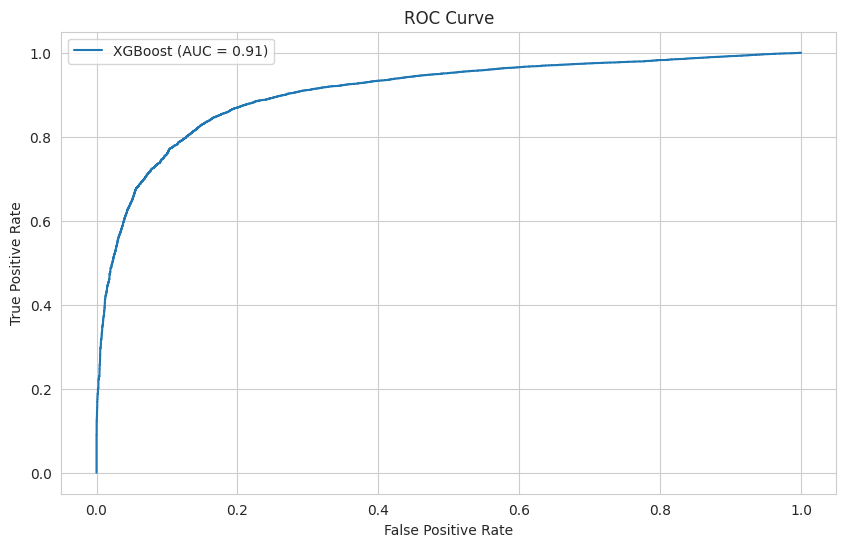

In [ ]:
# Calculate ROC-AUC Score
y_pred_proba = xgb_model.predict_proba(X_test)[:, 1]
roc_auc = roc_auc_score(y_test, y_pred_proba)
print("ROC-AUC Score:", roc_auc)

# Plot ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
plt.plot(fpr, tpr, label=f"XGBoost (AUC = {roc_auc:.2f})")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()


# **Feature Selection & Hyperparameter Tuning**

## **XGBoost Tuned Model**

### **Feature Selection for XGBoost**

Since we have a lot of features still, our approach in feature selection is to use both Feature Importance and Recursive Feature Elimination (RFE). We use Feature Importance to shortlist a set of important features and then run RFE to find the most effective subset of those features.


### **Feature Importance Scores from XGB**

In [ ]:
# Extract feature importance from the trained model
xgb_importance = xgb_model.get_booster().get_score(importance_type='weight')
sorted_importance = sorted(xgb_importance.items(), key=lambda x: x[1], reverse=True)

The feature importance scores are extracted from the trained XGBoost model using the `get_booster().get_score()` method. This method returns a dictionary where the keys are the feature names, and the values represent the importance scores for each feature, using the specified importance type (in this case, '`weight`'). These importance scores are then sorted in descending order, so that the features with the highest importance are placed at the beginning of the list. The `sorted()` function is used with a lambda function to sort the dictionary items by the importance score `(x[1])`, ensuring that the most influential features come first.



> For better viewing, we separate the top 5 most important features from the remaining features and organize them into distinct lists. These are stored in the top_5_features and top_5_scores lists. Similarly, the remaining features and scores (i.e., all features excluding the top 5) are stored in remaining_features and remaining_scores.


In [ ]:
# Identify the top 3 features and their importance scores
top_5_features = [k for k, v in sorted_importance[:5]]
top_5_scores = [v for k, v in sorted_importance[:5]]

# Identify the remaining features and their importance scores
remaining_features = [k for k, v in sorted_importance[5:]]
remaining_scores = [v for k, v in sorted_importance[5:]]

# Combine the top 5 features and the remaining features
all_features = top_5_features + remaining_features
all_scores = top_5_scores + remaining_scores

In [ ]:
# Create color list: 'rgb(255, 99, 71)' for top 5 and 'rgb(135, 206, 250)' for others
colors = ['#03DAC6'] * len(top_5_features) + ['#018786'] * len(remaining_features)

# Reverse the order of the features and scores for plotting
all_features_reversed = all_features[::-1]
all_scores_reversed = all_scores[::-1]

# Adjust the color list based on the reversed order
colors_reversed = colors[::-1]

# Plot feature importance
fig = go.Figure(
    data=[go.Bar(
        y=all_features_reversed,  # Features (reversed order for most important on top)
        x=all_scores_reversed,  # Importance scores (reversed order)
        orientation='h',  # Horizontal bar chart
        marker=dict(color=colors_reversed)  # Set color based on top 5 vs others
    )]
)

# Update layout for dark background and other styling
fig.update_layout(
    title="Feature Importance from XGBoost",
    xaxis_title="Importance Score",
    yaxis_title="Features",
    plot_bgcolor='rgb(24, 24, 24)',  # Dark background color
    paper_bgcolor='rgb(24, 24, 24)',  # Dark paper color
    font=dict(color='white'),  # White text color
    title_x=0.5,  # Center the title
    height=800,  # Increase height of the chart for more space
    margin=dict(l=200, r=50, t=50, b=50),  # Increase left margin for labels
    yaxis=dict(tickangle=0)  # Rotate y-axis labels to make them more readable
)

# Show the plot
fig.show()


The feature importance analysis from the XGBoost model indicates that several financial indicators play a significant role in predicting credit risk or financial stability. `Outstanding_Debt` is the most important feature, suggesting that the amount of debt an individual carries is a key factor in the model’s predictions. `Changed_Credit_Limit` follows closely, reflecting how adjustments to credit limits could signal financial behavior or instability, which is crucial in assessing an individual’s risk. `Credit_History_Age` also ranks highly, emphasizing the significance of a long, established credit history in predicting reliability and lower risk. `Interest_Rate` and `Delayed_from_due_Date` also ranks high.

### **Recursive Feature Elimination (RFE)**


RFE helps to reduce the number of features by identifying and removing less important features. It's also great to use RFE to re-check whether the Feature Importance by XGBoost have evident discrepancies with RFE's selected features.

In [ ]:
# Recursive Feature Elimination
selector = RFE(estimator=xgb_model, n_features_to_select=10)  # Adjust n_features_to_select as needed
selector = selector.fit(X_train, y_train)

# Get selected features
selected_features = X_train.columns[selector.support_]
print("Selected Features:", selected_features)


Selected Features: Index(['Month', 'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate',
       'Delay_from_due_date', 'Changed_Credit_Limit', 'Credit_Mix',
       'Outstanding_Debt', 'Loan_Count', 'Credit-Builder Loan'],
      dtype='object')


##### **Interpretation of Selected Features from Recursive Feature Elimination (RFE)**

The Recursive Feature Elimination (RFE) process identified 10 key features as the most relevant for predicting credit risk. These include: `Month`, `Num_Bank_Accounts`, `Num_Credit_Card`, `Interest_Rate`, `Delay_from_due_date`, `Changed_Credit_Limit`, `Credit_Mix`, `Outstanding_Debt`, `Loan_Count`, and `Credit-Builder Loan`. These features were selected based on their contribution to the predictive power of the model used in the RFE process.

Interestingly, there is overlap between the features identified through RFE and the most important features from the XGBoost model. Both methods have the features: **`Outstanding_Debt` and `Changed_Credit_Limit`, `Interest_Rate` and `Delay_from_due_date`** appear in both the **RFE and XGBoost rankings**. These features suggest that debt-related indicators and payment behavior are central to the prediction of credit risk.

However, RFE has selected additional features like `Month`, `Num_Bank_Accounts`, `Num_Credit_Card`, `Credit_Mix`, `Loan_Count`, and `Credit-Builder Loan`, which were not as prominent in the XGBoost feature importance rankings.

This discrepancy could be attributed to the differences in the algorithms' methodologies.

> For retraining, we will be using the Top 10 from RFE but we also add additional features ranked highly by both methods based on XGBoost and domain knowledge.:
* Interest_Rate (ranked highly by both methods)
* Outstanding_Debt (ranked highly by both methods)
* Changed_Credit_Limit (ranked highly by both methods)
* Credit_Mix (important in both methods)
*  Num_of_Delayed_Payment (captures payment behavior)
*  Debt_to_Income_Ratio (financial health indicator)
*  Credit_Utilization_Ratio (indicates how much available credit is being used)



In [ ]:
# Select Features for Re-Training
selected_features = [ 'Month', 'Num_Bank_Accounts','Num_Credit_Card',
                     'Interest_Rate', 'Delay_from_due_date', 'Changed_Credit_Limit',
                      'Credit_Mix', 'Outstanding_Debt', 'Loan_Count', 'Credit-Builder Loan',
                      'Num_of_Delayed_Payment', 'Debt_to_Income_Ratio','Credit_Utilization_Ratio']

X_train_xgbselected = X_train[selected_features]
X_test_xgbselected = X_test[selected_features]


This feature set includes key financial indicators identified by both RFE and XGBoost, such as `Outstanding_Debt`, `Changed_Credit_Limit`, and `Interest_Rate`, which are crucial for assessing credit risk. Features selected by RFE, like `Delay_from_due_date` and `Loan_Count`, provide important details about an individual's payment behavior and credit management. To further improve the model, **financial health indicators** such as `Num_of_Delayed_Payment`, `Debt_to_Income_Ratio` and `Credit_Utilization_Ratio` are added in order to offer a broader understanding of an individual's financial stability.

### **Handle Imbalanced Data with SMOTE**


In [ ]:
# Apply SMOTE to balance the class distribution in the training set
smote = SMOTE(random_state=42)
X_train_xgbsmote, y_train_xgbsmote = smote.fit_resample(X_train_xgbselected, y_train)

# Check the new class distribution
print(f"New class distribution after SMOTE:\n{y_train_xgbsmote.value_counts()}")


New class distribution after SMOTE:
Credit_Score
1    56876
0    56876
Name: count, dtype: int64


### **Hyperparameter Tuning for XGBoost**

We optimize hyperparameters to improve the model's performance using `GridSearchCV` to systematically test combinations of parameters. Since what we're primarily try to do is identify poor credit scores, what we can do is define a scoring function to optimize for recall for the negative class (class 0). We do this because recall for class 0 is more important because it reflects how many of the poor credit cases (class 0) are captured by the model, which directly affects the identification of high-risk individuals.

In [ ]:
# Define your custom scorer function
def custom_scorer(estimator, X, y):
    y_pred = estimator.predict(X)
    return recall_score(y, y_pred, pos_label=0)  # Focus on class 0 (negative class)

# Create a custom scorer using make_scorer
custom_scorer = make_scorer(custom_scorer)

In this hyperparameter tuning process, the goal is to optimize the hyperparameters of an XGBoost classifier for better model performance. First, the data is split into training and evaluation datasets. Then, `RandomizedSearchCV` is used to explore a wide range of hyperparameters, including learning rate, max depth, number of estimators, and others, with the objective of finding an initial set of good hyperparameters. The random search is set to optimize for the F1-macro score, which balances precision and recall across both classes.

After the random search completes, the best hyperparameters are used to refine the parameter grid for a more focused search with GridSearchCV. This fine-tuning process narrows down the hyperparameter values to those closest to the best found during random search, allowing for further optimization.

Once the refined parameters are determined, the final XGBoost model is trained using the best parameters from GridSearchCV. This model is then evaluated on the provided evaluation set to prevent overfitting and ensure robust performance. The goal is to improve classification accuracy, especially for the minority class, while maintaining a balanced performance across both classes.







In [ ]:
# Split the data into training and evaluation datasets
X_train_final, X_eval, y_train_final, y_eval = train_test_split(X_train_xgbsmote, y_train_xgbsmote, test_size=0.2, random_state=42)

# Define the parameter grid for RandomizedSearchCV
param_grid = {
    'learning_rate': [0.01, 0.1, 0.2, 0.3],
    'max_depth': [3, 5, 7, 9],
    'n_estimators': [50, 100, 200, 300],
    'subsample': [0.5, 0.7, 0.9, 1.0],
    'colsample_bytree': [0.5, 0.7, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2, 0.3],
    'scale_pos_weight': [1, 10, 25, 50],
    'min_child_weight': [1, 5, 10],
}

# RandomizedSearchCV for initial hyperparameter exploration
random_search = RandomizedSearchCV(
    estimator=xgb.XGBClassifier(
        use_label_encoder=False,
        eval_metric='logloss',
        early_stopping_rounds=10
    ),
    param_distributions=param_grid,  # Parameter grid for random search
    scoring='f1_macro',  # Optimizing for balanced F1-score
    n_iter=50,  # Number of random configurations to test
    cv=3,  # Cross-validation folds
    verbose=1,
    random_state=42,
    n_jobs=-1  # Use all available cores
)

# Fit RandomizedSearchCV to the provided training data
random_search.fit(
    X_train_final, y_train_final,  # Use consistent training dataset
    eval_set=[(X_eval, y_eval)],  # Evaluation set for early stopping
    verbose=True
)

# Retrieve best parameters from RandomizedSearchCV
best_params_random = random_search.best_params_
print(f"Best parameters from RandomizedSearchCV: {best_params_random}")

# Refine parameter grid for GridSearchCV using results from RandomizedSearchCV
refined_param_grid = {
    'learning_rate': [
        best_params_random['learning_rate'] / 2,
        best_params_random['learning_rate'],
        best_params_random['learning_rate'] * 2
    ],
    'max_depth': [
        best_params_random['max_depth'] - 1,
        best_params_random['max_depth'],
        best_params_random['max_depth'] + 1
    ],
    'n_estimators': [best_params_random['n_estimators']],
    'subsample': [
        max(0.1, best_params_random['subsample'] - 0.1),  # Ensure >0
        best_params_random['subsample'],
        min(1.0, best_params_random['subsample'] + 0.1)  # Ensure ≤1
    ],
    'colsample_bytree': [best_params_random['colsample_bytree']],
    'gamma': [
        max(0, best_params_random['gamma'] - 0.1),  # Ensure ≥0
        best_params_random['gamma'],
        best_params_random['gamma'] + 0.1
    ],
    'scale_pos_weight': [best_params_random.get('scale_pos_weight', 1)]  # Default to 1 if not present
}

# GridSearchCV for fine-tuning
grid_search = GridSearchCV(
    estimator=xgb.XGBClassifier(
        use_label_encoder=False,
        eval_metric='logloss',
        early_stopping_rounds=10
    ),
    param_grid=refined_param_grid,  # Refined parameter grid
    scoring='f1_macro',
    cv=3,  # Cross-validation folds
    verbose=1,
    n_jobs=-1  # Use all available cores
)

# Fit GridSearchCV to the provided training data
grid_search.fit(
    X_train_final, y_train_final,  # Use consistent training dataset
    eval_set=[(X_eval, y_eval)],  # Evaluation set for early stopping
    verbose=True
)

# Retrieve best parameters from GridSearchCV
best_params_grid = grid_search.best_params_
print(f"Best parameters from GridSearchCV: {best_params_grid}")

# Define the final XGBoost model using best parameters from GridSearchCV
xgb_model_best = xgb.XGBClassifier(
    use_label_encoder=False,
    eval_metric='logloss',
    early_stopping_rounds=10,
    **best_params_grid  # Apply the best parameters from GridSearchCV
)

# Train the final model on the full training data
xgb_model_best.fit(
    X_train_final, y_train_final,  # Use consistent training dataset
    eval_set=[(X_eval, y_eval)],  # Evaluation set for early stopping
    verbose=True
)


Fitting 3 folds for each of 50 candidates, totalling 150 fits
[0]	validation_0-logloss:0.61066
[1]	validation_0-logloss:0.56020
[2]	validation_0-logloss:0.52382
[3]	validation_0-logloss:0.49133
[4]	validation_0-logloss:0.45902
[5]	validation_0-logloss:0.43834
[6]	validation_0-logloss:0.42169
[7]	validation_0-logloss:0.40070
[8]	validation_0-logloss:0.38620
[9]	validation_0-logloss:0.37690
[10]	validation_0-logloss:0.36414
[11]	validation_0-logloss:0.35412
[12]	validation_0-logloss:0.34842
[13]	validation_0-logloss:0.34210
[14]	validation_0-logloss:0.33909
[15]	validation_0-logloss:0.33372
[16]	validation_0-logloss:0.33016
[17]	validation_0-logloss:0.32536
[18]	validation_0-logloss:0.32165
[19]	validation_0-logloss:0.31947
[20]	validation_0-logloss:0.31648
[21]	validation_0-logloss:0.31282
[22]	validation_0-logloss:0.31038
[23]	validation_0-logloss:0.30836
[24]	validation_0-logloss:0.30738
[25]	validation_0-logloss:0.30553
[26]	validation_0-logloss:0.30392
[27]	validation_0-logloss:0.30

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5, device=None, early_stopping_rounds=10,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=0.30000000000000004, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=10,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=300,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

In [ ]:
# Evaluate on the test data
y_pred = xgb_model_best.predict(X_test_xgbselected)

### **Evaluate the Tuned XGBoost Model**

In [ ]:
# Calculate the evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, pos_label=0)  # For class 0 (negative class)
recall = recall_score(y_test, y_pred, pos_label=0)  # For class 0 (negative class)
f1 = f1_score(y_test, y_pred, pos_label=0)  # For class 0 (negative class)


# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Print the results
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision (class 0): {precision:.4f}")
print(f"Recall (class 0): {recall:.4f}")
print(f"F1-Score (class 0): {f1:.4f}")
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8602
Precision (class 0): 0.7738
Recall (class 0): 0.7407
F1-Score (class 0): 0.7569
Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.74      0.76      5874
           1       0.89      0.91      0.90     14126

    accuracy                           0.86     20000
   macro avg       0.83      0.83      0.83     20000
weighted avg       0.86      0.86      0.86     20000



The tuned model demonstrated **notable improvements** in the **classification of the minority class (Class 0)**. Specifically, **`precision` increased by 1.38%**, **`recall` improved by 3.07%**, and **`F1-score` rose by 1.69%.**

These changes indicate that the **tuned model is better at identifying Class 0**, reducing both false positives and false negatives. Meanwhile, *the metrics for the majority class (Class 1) remained stable, with no degradation in performance.*

Overall, the accuracy of the model **improved from 85% to 86.02%**, highlighting a general enhancement in classification performance. Additionally, both the macro and weighted averages for precision, recall, and F1-score showed slight increases, suggesting a more balanced performance across both classes. The confusion matrix further reveals that the tuned model reduced false positives (Class 1 predicted as Class 0) slightly, while maintaining a high number of true positives for Class 1, with 12,854 correctly classified instances. It can be concluded that the tuned model demonstrates a better balance between precision and recall for the minority class (Class 0) while maintaining high performance for the majority class (Class 1). This makes the tuned model a clear improvement over the baseline.

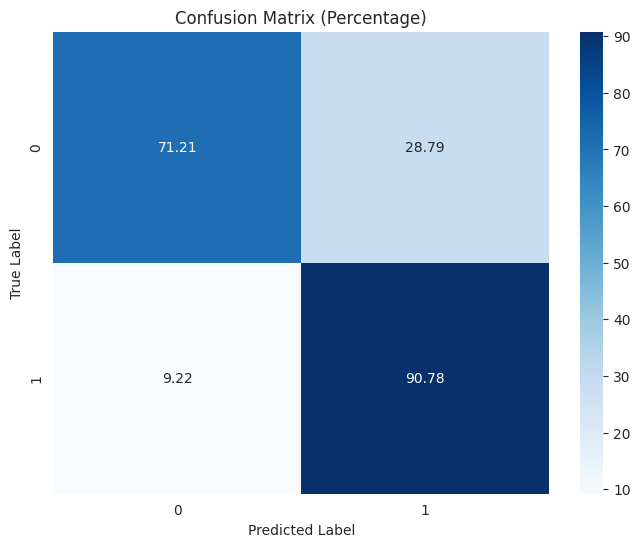

In [ ]:
# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Convert the confusion matrix to percentage form
cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_percentage, annot=True, fmt='.2f', cmap='Blues', xticklabels=xgb_model.classes_, yticklabels=xgb_model.classes_)
plt.title("Confusion Matrix (Percentage)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

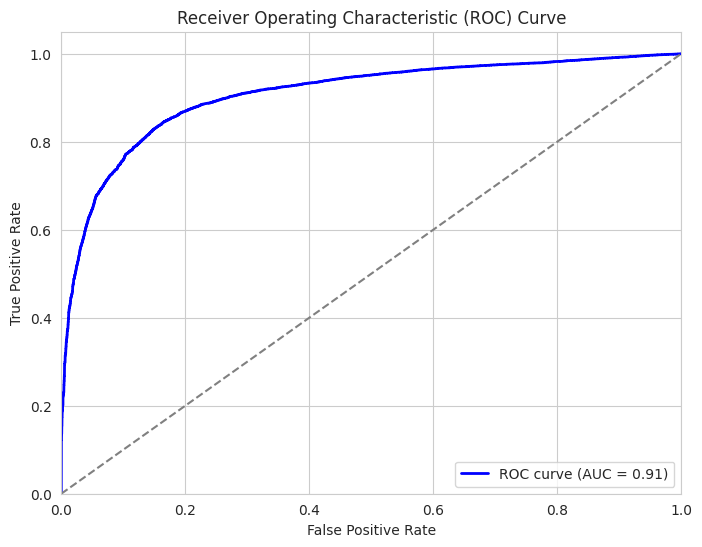

In [ ]:
# Obtain predicted probabilities for ROC curve (class 1 probabilities)
y_pred_prob = xgb_model.predict_proba(X_test)[:, 1]  # Taking the probability of class 1

# Compute ROC curve and ROC AUC
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)  # y_pred_prob is the predicted probabilities
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# **Model Explainability**




## **Explaining XGBoost using SHAP and LIME**

### **SHAP for XGBoost**

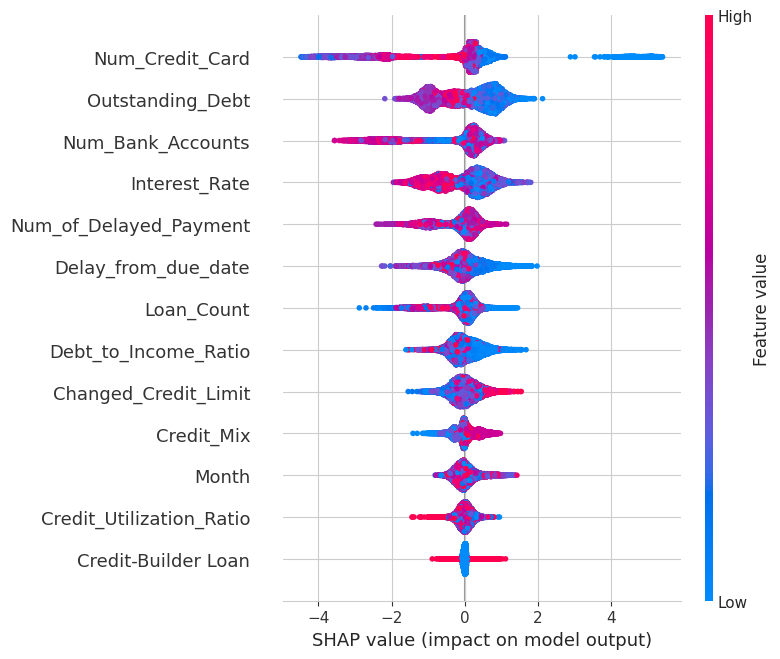

In [ ]:
# Initialize SHAP explainer using the fitted model
explainer = shap.TreeExplainer(xgb_model_best)

# Explain the model's predictions for the evaluation set (X_eval)
shap_values = explainer.shap_values(X_eval, approximate=True)

# Visualize SHAP summary plot (shows the impact of each feature)
shap.summary_plot(shap_values, X_eval)

This SHAP summary plot displays the impact of each feature on the model's predictions. Features are ranked from top to bottom based on their average SHAP value magnitude, indicating their contribution to the model's output. Each dot represents a specific observation, colored by the feature's value (red for high, blue for low). For instance, "Num_Credit_Card" and "Outstanding_Debt" are among the most influential features, with higher values generally increasing or decreasing the predicted credit score depending on the SHAP value distribution.The features are ranked by their overall importance, with those having the greatest impact on predictions appearing at the top. Each dot represents a single data point, and its position on the x-axis indicates the magnitude and direction of the feature's influence (positive or negative) on the prediction. The color of the dots reflects the feature's value for that observation, with red representing higher feature values and blue representing lower ones.

For example, "Num_Credit_Card" is the most impactful feature, suggesting that the number of credit cards strongly affects the credit score, with high values (red dots) often leading to higher SHAP values (positive impact) or lower SHAP values (negative impact), depending on context. Similarly, "Outstanding_Debt" and "Num_Bank_Accounts" also show strong influence, indicating that financial behavior and account activity significantly shape creditworthiness. Features like "Credit_Mix" and "Credit-Builder Loan," while lower-ranked, still provide meaningful contributions to predictions for specific cases. This plot not only ranks feature importance but also reveals how feature values interact with the model to produce predictions.

### **LIME for XGBoost**

In [ ]:
# Initialize LIME explainer for tabular data
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_final),
    mode="classification",
    class_names=["Class 0", "Class 1"],  # Modify as per your class names
    feature_names=X_train_final.columns,
    discretize_continuous=True
)

# Choose a sample from the evaluation set to explain
i = 0  # You can change this to any index you want to explain
exp = explainer_lime.explain_instance(X_eval.iloc[i], xgb_model_best.predict_proba, num_features=10)

# Visualize the LIME explanation for the selected instance
exp.show_in_notebook()

In this LIME instance, the model predicts a higher likelihood for Class 1 (positive class), with a probability of 0.80 compared to 0.20 for Class 0 (negative class), indicating the instance is more likely to be classified as a positive credit score or a good borrower. Key features influencing this prediction include the number of credit cards, which positively impacts the likelihood of Class 1, and the level of outstanding debt, which also supports a positive classification. However, features like the number of delayed payments, credit utilization ratio, and delays from due dates strongly contribute to a negative prediction, signaling a higher risk of default or poor creditworthiness.

The **credit utilization ratio**, in particular, **has a significant negative effect**, suggesting that higher usage of available credit reduces the chances of being classified positively. Additionally, **delayed payments and payment delays decrease the likelihood of a good credit score**. While some features, such as interest rate and credit-builder loans, have smaller impacts, they still suggest that lower interest rates and efforts to build credit have a slight positive influence on the prediction.

Overall, the model's decision is primarily driven by financial behaviors such as credit utilization and payment history where negative indicators like delays and high credit utilization lower the chances of being classified as a good borrower, while positive indicators like a lower level of outstanding debt and a reasonable number of credit cards support the positive classification.

# Model Comparison

# Final Model Selection and Interpretation